In [1]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.
import kagglehub
jessicali9530_celeba_dataset_path = kagglehub.dataset_download('jessicali9530/celeba-dataset')

print('Data source import complete.')


Using Colab cache for faster access to the 'celeba-dataset' dataset.
Data source import complete.


In [2]:
import os
import time
from tqdm import tqdm
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers
import matplotlib.pyplot as plt
!wget https://raw.githubusercontent.com/AshishJangra27/Face-Generator-with-GAN/main/generator_700.h5


IMAGE_SHAPE = (128, 128, 3)
NOISE_DIM = 100
BATCH_SIZE = 128
EPOCHS = 50
DATA_PATH = '/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/'

def preprocess_image(file_path):
    img_raw = tf.io.read_file(file_path)
    img = tf.image.decode_jpeg(img_raw, channels=3)
    img = tf.image.resize(img, (IMAGE_SHAPE[0], IMAGE_SHAPE[1]))
    img = (img / 127.5) - 1.0  # Normalize to [-1, 1]
    return img

def load_celeba_images(path):
    all_files = [os.path.join(path, f) for f in os.listdir(path)[:10000] if f.endswith('.jpg')]
    dataset = tf.data.Dataset.from_tensor_slices(all_files)
    dataset = dataset.map(preprocess_image, num_parallel_calls=tf.data.AUTOTUNE)

    images_list = []
    for batch in tqdm(dataset.batch(1024).prefetch(tf.data.AUTOTUNE)):
        images_list.append(batch)

    return tf.concat(images_list, axis=0)

images = load_celeba_images(DATA_PATH)
dataset = tf.data.Dataset.from_tensor_slices(images) \
                         .shuffle(buffer_size=50000) \
                         .batch(BATCH_SIZE) \
                         .prefetch(tf.data.AUTOTUNE)

--2025-12-25 05:21:59--  https://raw.githubusercontent.com/AshishJangra27/Face-Generator-with-GAN/main/generator_700.h5
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 24338984 (23M) [application/octet-stream]
Saving to: ‘generator_700.h5’

generator_700.h5    100%[===================>]  23.21M  64.1MB/s    in 0.4s    

2025-12-25 05:22:01 (64.1 MB/s) - ‘generator_700.h5’ saved [24338984/24338984]



100%|██████████| 10/10 [00:27<00:00,  2.72s/it]


In [3]:
import tensorflow as tf
from tensorflow.keras import layers

def build_generator(NOISE_DIM=NOISE_DIM):
    model = tf.keras.Sequential([
        # 1) Start with a dense layer that reshapes to 8x8 with 512 channels
        layers.Dense(8*8*512, use_bias=False, input_shape=(NOISE_DIM,)),
        layers.Reshape((8, 8, 512)),
        layers.BatchNormalization(),
        layers.LeakyReLU(),

        # 2) Upsample to 16x16
        layers.Conv2DTranspose(256, (4,4), strides=(2,2), padding='same', use_bias=False),
        layers.BatchNormalization(),
        layers.LeakyReLU(),

        # 3) Upsample to 32x32
        layers.Conv2DTranspose(128, (4,4), strides=(2,2), padding='same', use_bias=False),
        layers.BatchNormalization(),
        layers.LeakyReLU(),

        # 4) Upsample to 64x64
        layers.Conv2DTranspose(64, (4,4), strides=(2,2), padding='same', use_bias=False),
        layers.BatchNormalization(),
        layers.LeakyReLU(),

        # 5) Upsample to 128x128
        layers.Conv2DTranspose(32, (4,4), strides=(2,2), padding='same', use_bias=False),
        layers.BatchNormalization(),
        layers.LeakyReLU(),

        # 6) Final layer → 128x128x3, use tanh for output in [-1,1]
        layers.Conv2DTranspose(3, (4,4), strides=(1,1), padding='same', use_bias=False, activation='tanh')
    ], name="Generator")

    return model


def build_discriminator():
    model = tf.keras.Sequential([
        # 1) Downsample from 128x128 to 64x64
        layers.Conv2D(64, (4,4), strides=(2,2), padding='same',
                      input_shape=(128,128,3)),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.3),

        # 2) Downsample to 32x32
        layers.Conv2D(128, (4,4), strides=(2,2), padding='same'),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.3),

        # 3) Downsample to 16x16
        layers.Conv2D(256, (4,4), strides=(2,2), padding='same'),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.3),

        # 4) Downsample to 8x8
        layers.Conv2D(512, (4,4), strides=(2,2), padding='same'),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.3),

        # 5) Flatten to a single logit
        layers.Flatten(),
        layers.Dense(1)
    ], name="Discriminator")

    return model

In [5]:
generator = tf.keras.models.load_model('/content/generator_700.h5'
, compile=False)
discriminator = build_discriminator()


cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    return real_loss + fake_loss

gen_optimizer = tf.keras.optimizers.Adam(1e-4)
disc_optimizer = tf.keras.optimizers.Adam(1e-4)

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.12/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


In [6]:
def train_step(real_images):
    noise = tf.random.normal([BATCH_SIZE, NOISE_DIM])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)

        # Ensure shapes match
        assert generated_images.shape[1:] == IMAGE_SHAPE, "Generated image shape mismatch!"
        assert real_images.shape[1:] == IMAGE_SHAPE, "Real image shape mismatch!"

        real_output = discriminator(real_images, training=True)
        fake_output = discriminator(generated_images, training=True)

        g_loss = generator_loss(fake_output)
        d_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(g_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(d_loss, discriminator.trainable_variables)

    gen_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    disc_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return g_loss, d_loss


def generate_and_show_images(noise):
    # Generate images
    preds = generator(noise, training=False)
    preds = (preds + 1) / 2.0  # Shift from [-1,1] to [0,1]

    # Plot
    fig = plt.figure(figsize=(4,4))
    for i in range(preds.shape[0]):
        plt.subplot(4,4,i+1)
        plt.imshow(preds[i])
        plt.axis('off')
    plt.show()

In [ ]:
# def train(dataset, epochs):
#     fixed_noise = tf.random.normal([16, NOISE_DIM])  # Fixed noise for generating sample images
#     total_start_time = time.time()  # Start time for total training

#     for epoch in range(epochs):
#         epoch_start_time = time.time()  # Start time for the current epoch

#         g_losses = []
#         d_losses = []

#         for image_batch in dataset:
#             g_loss, d_loss = train_step(image_batch)
#             g_losses.append(g_loss)
#             d_losses.append(d_loss)

#         # Calculate average losses for the epoch
#         avg_g_loss = tf.reduce_mean(g_losses)
#         avg_d_loss = tf.reduce_mean(d_losses)

#         # Time taken for the epoch
#         epoch_end_time = time.time()
#         epoch_duration = epoch_end_time - epoch_start_time

#         # Print epoch details
#         print(f"Epoch {epoch+1}/{epochs} | "
#               f"Generator loss: {avg_g_loss:.4f}, "
#               f"Discriminator loss: {avg_d_loss:.4f} | "
#               f"Time: {epoch_duration:.2f} seconds")

#         # Generate and show images for the current epoch
#         generate_and_show_images(fixed_noise)

#     # Total time taken for training
#     total_end_time = time.time()
#     total_duration = total_end_time - total_start_time
#     print(f"\nTotal Training Time: {total_duration:.2f} seconds")

In [7]:
import tensorflow as tf
strategy = tf.distribute.MirroredStrategy(devices=["/gpu:0", "/gpu:1"])

with strategy.scope():
    generator = build_generator()
    discriminator = build_discriminator()

    cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

    def generator_loss(fake_output):
        return cross_entropy(tf.ones_like(fake_output), fake_output)

    def discriminator_loss(real_output, fake_output):
        real_loss = cross_entropy(tf.ones_like(real_output), real_output)
        fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
        return real_loss + fake_loss

    gen_optimizer = tf.keras.optimizers.Adam(1e-4)
    disc_optimizer = tf.keras.optimizers.Adam(1e-4)

# Existing dataset creation
dataset = tf.data.Dataset.from_tensor_slices(images).shuffle(10000).batch(BATCH_SIZE)

# Make a distributed dataset
dist_dataset = strategy.experimental_distribute_dataset(dataset)

@tf.function

def distributed_train_step(dataset_inputs):
    def step_fn(real_images):
        return train_step(real_images)  # The train_step you already have

    per_replica_g_loss, per_replica_d_loss = strategy.run(step_fn, args=(dataset_inputs,))
    mean_g_loss = strategy.reduce(tf.distribute.ReduceOp.SUM, per_replica_g_loss, axis=None)
    mean_d_loss = strategy.reduce(tf.distribute.ReduceOp.SUM, per_replica_d_loss, axis=None)
    return mean_g_loss, mean_d_loss


def train(dataset, epochs):
    fixed_noise = tf.random.normal([16, NOISE_DIM])
    total_start_time = time.time()

    for epoch in range(epochs):
        epoch_start_time = time.time()

        g_losses = []
        d_losses = []

        for image_batch in dist_dataset:  # Use distributed dataset
            g_loss, d_loss = distributed_train_step(image_batch)
            g_losses.append(g_loss)
            d_losses.append(d_loss)

        avg_g_loss = tf.reduce_mean(g_losses)
        avg_d_loss = tf.reduce_mean(d_losses)

        epoch_duration = time.time() - epoch_start_time
        print(f"Epoch {epoch+1}/{epochs} | "
              f"Generator loss: {avg_g_loss:.4f}, "
              f"Discriminator loss: {avg_d_loss:.4f} | "
              f"Time: {epoch_duration:.2f} s")

        generate_and_show_images(fixed_noise)

    total_duration = time.time() - total_start_time
    print(f"\nTotal Training Time: {total_duration:.2f} seconds")

/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50 | Generator loss: 11.8749, Discriminator loss: 0.2769 | Time: 56.80 s


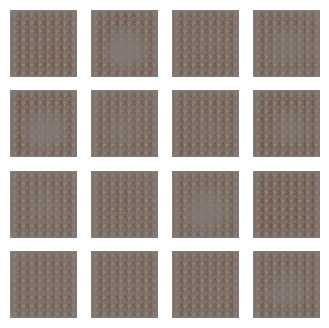

Epoch 2/50 | Generator loss: 13.7213, Discriminator loss: 0.9697 | Time: 51.54 s


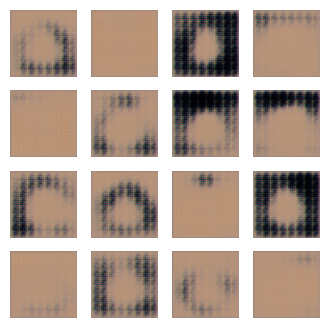

Epoch 3/50 | Generator loss: 7.9105, Discriminator loss: 0.3418 | Time: 51.37 s


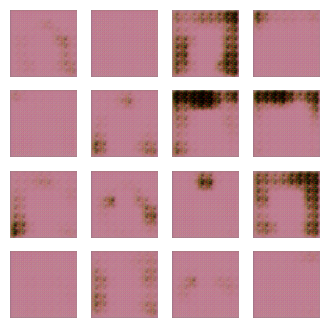

Epoch 4/50 | Generator loss: 11.9777, Discriminator loss: 1.0167 | Time: 52.00 s


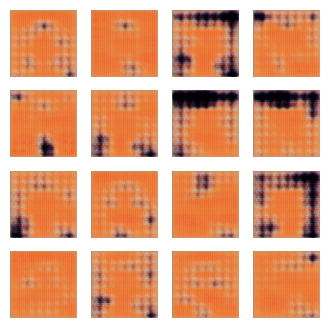

Epoch 5/50 | Generator loss: 6.7048, Discriminator loss: 1.4958 | Time: 52.06 s


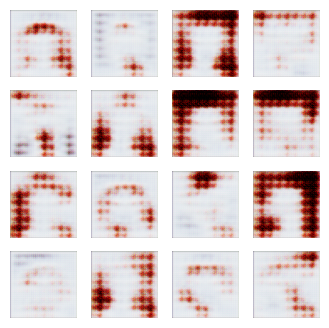

Epoch 6/50 | Generator loss: 4.5832, Discriminator loss: 1.4135 | Time: 52.13 s


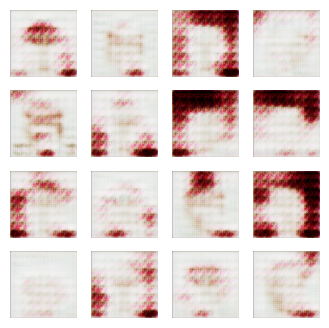

Epoch 7/50 | Generator loss: 5.7676, Discriminator loss: 1.2637 | Time: 51.99 s


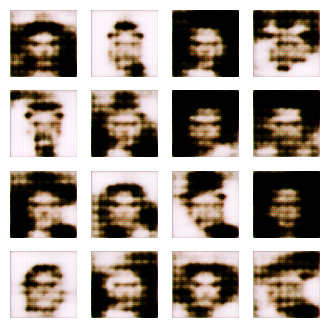

Epoch 8/50 | Generator loss: 5.1396, Discriminator loss: 1.2724 | Time: 52.20 s


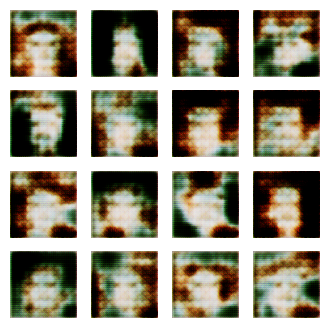

Epoch 9/50 | Generator loss: 5.2487, Discriminator loss: 1.1565 | Time: 51.98 s


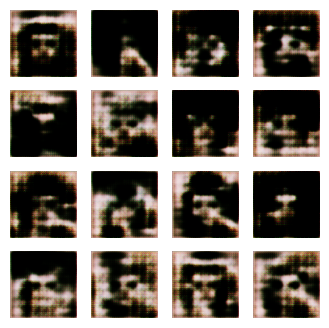

Epoch 10/50 | Generator loss: 4.3355, Discriminator loss: 1.4741 | Time: 52.30 s


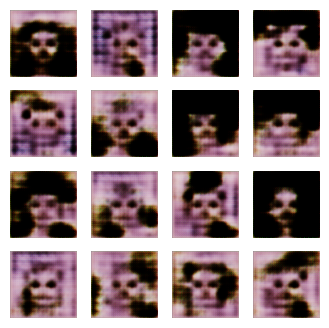

Epoch 11/50 | Generator loss: 4.0537, Discriminator loss: 1.5810 | Time: 51.98 s


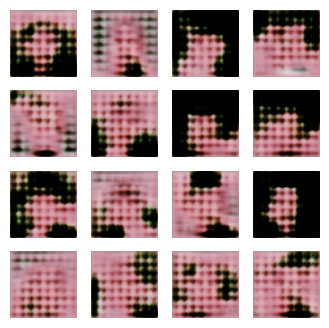

Epoch 12/50 | Generator loss: 5.9514, Discriminator loss: 1.1301 | Time: 52.08 s


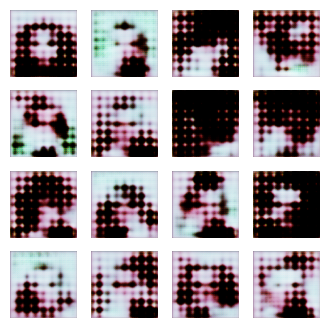

Epoch 13/50 | Generator loss: 5.0485, Discriminator loss: 1.4510 | Time: 52.02 s


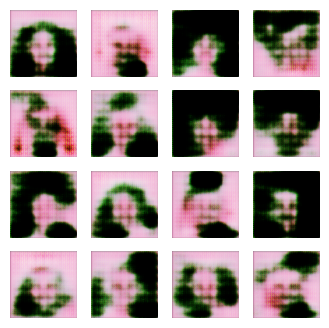

Epoch 14/50 | Generator loss: 4.9445, Discriminator loss: 0.9995 | Time: 52.23 s


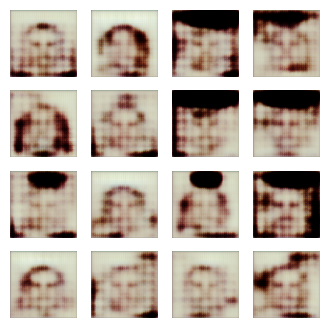

Epoch 15/50 | Generator loss: 6.9458, Discriminator loss: 0.6766 | Time: 52.17 s


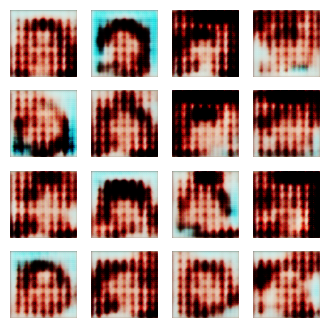

Epoch 16/50 | Generator loss: 6.0107, Discriminator loss: 1.2378 | Time: 51.92 s


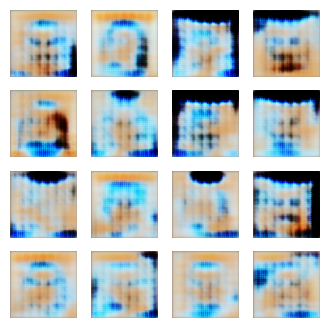

Epoch 17/50 | Generator loss: 6.0601, Discriminator loss: 1.0351 | Time: 52.08 s


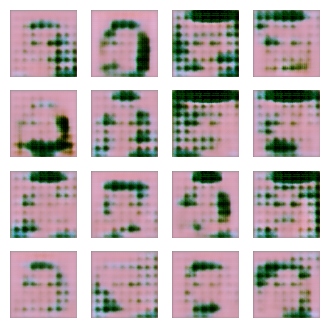

Epoch 18/50 | Generator loss: 7.1131, Discriminator loss: 0.7128 | Time: 52.13 s


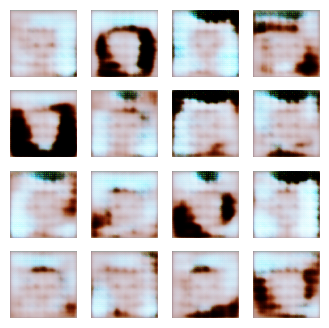

Epoch 19/50 | Generator loss: 5.6138, Discriminator loss: 1.2235 | Time: 52.27 s


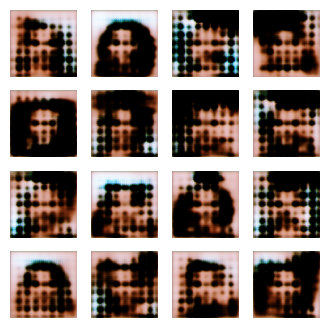

Epoch 20/50 | Generator loss: 5.5443, Discriminator loss: 0.9440 | Time: 52.11 s


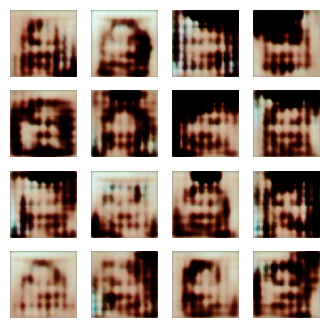

Epoch 21/50 | Generator loss: 6.1682, Discriminator loss: 0.9967 | Time: 52.21 s


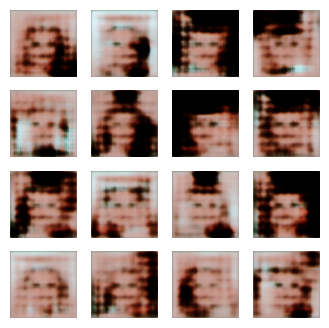

Epoch 22/50 | Generator loss: 4.8001, Discriminator loss: 1.0600 | Time: 52.08 s


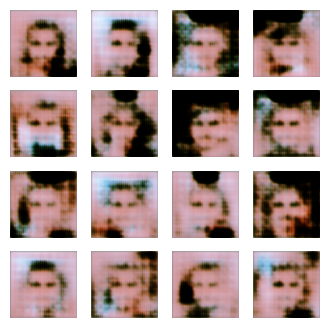

Epoch 23/50 | Generator loss: 6.3285, Discriminator loss: 0.8988 | Time: 52.12 s


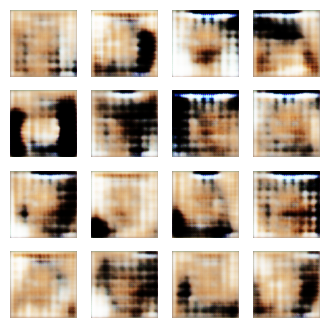

Epoch 24/50 | Generator loss: 5.0521, Discriminator loss: 1.1207 | Time: 52.11 s


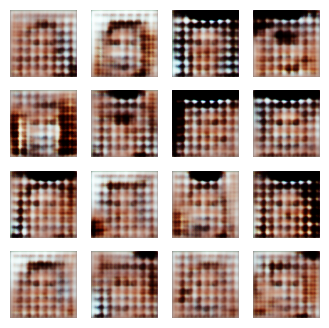

Epoch 25/50 | Generator loss: 4.9025, Discriminator loss: 1.0738 | Time: 52.13 s


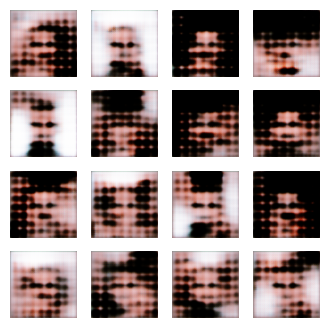

Epoch 26/50 | Generator loss: 4.8012, Discriminator loss: 0.9899 | Time: 52.18 s


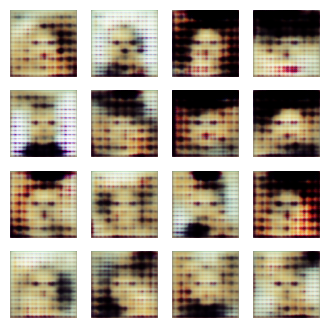

Epoch 27/50 | Generator loss: 6.5351, Discriminator loss: 1.0266 | Time: 52.01 s


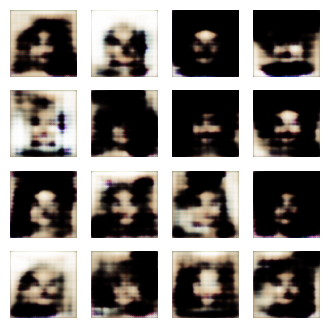

Epoch 28/50 | Generator loss: 5.2098, Discriminator loss: 0.6586 | Time: 52.16 s


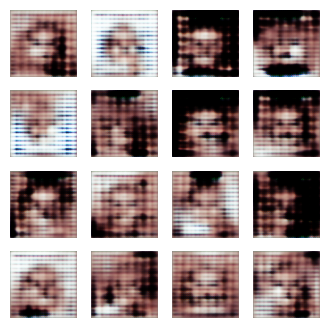

Epoch 29/50 | Generator loss: 6.5924, Discriminator loss: 0.9027 | Time: 52.12 s


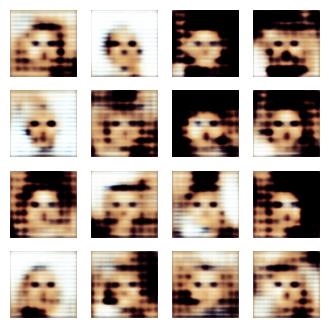

Epoch 30/50 | Generator loss: 5.5718, Discriminator loss: 0.9517 | Time: 51.86 s


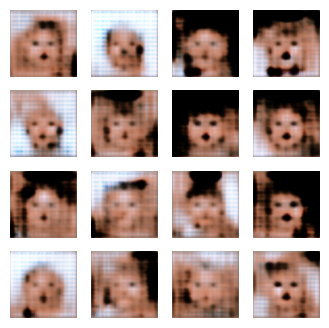

Epoch 31/50 | Generator loss: 5.8694, Discriminator loss: 0.9523 | Time: 52.14 s


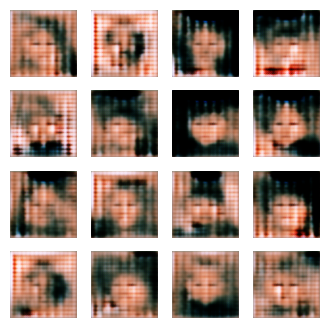

Epoch 32/50 | Generator loss: 5.5077, Discriminator loss: 1.1768 | Time: 52.02 s


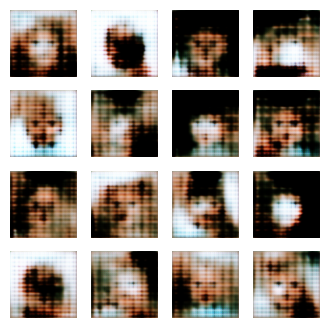

Epoch 33/50 | Generator loss: 5.2000, Discriminator loss: 0.9635 | Time: 52.02 s


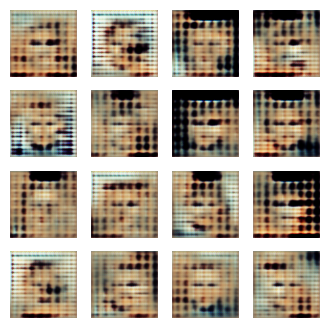

Epoch 34/50 | Generator loss: 6.0729, Discriminator loss: 1.0807 | Time: 52.11 s


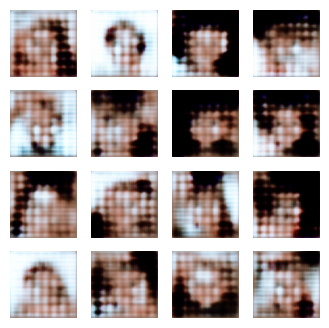

Epoch 35/50 | Generator loss: 5.4779, Discriminator loss: 1.0494 | Time: 51.96 s


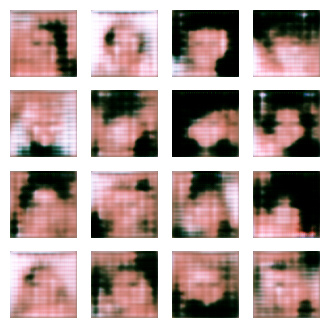

Epoch 36/50 | Generator loss: 6.2531, Discriminator loss: 0.9028 | Time: 52.06 s


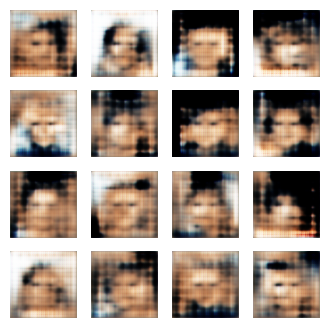

Epoch 37/50 | Generator loss: 4.9857, Discriminator loss: 1.0000 | Time: 52.06 s


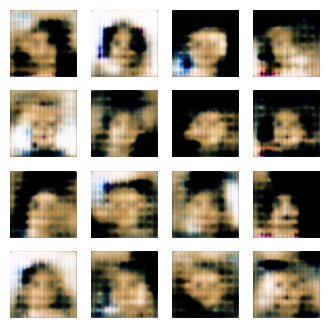

Epoch 38/50 | Generator loss: 5.9723, Discriminator loss: 0.9332 | Time: 52.21 s


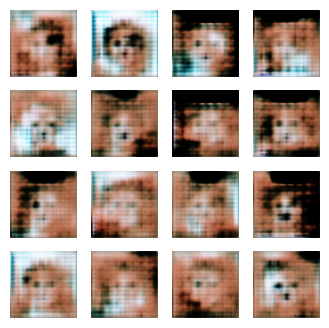

Epoch 39/50 | Generator loss: 5.7248, Discriminator loss: 0.8982 | Time: 51.73 s


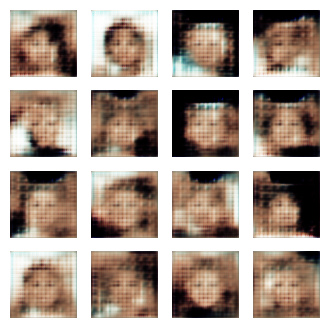

Epoch 40/50 | Generator loss: 5.1343, Discriminator loss: 1.0640 | Time: 52.07 s


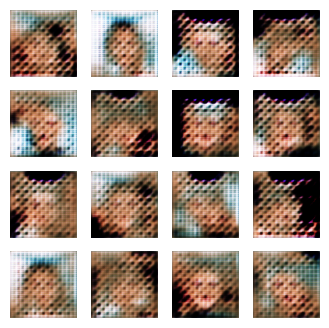

Epoch 41/50 | Generator loss: 6.2371, Discriminator loss: 0.7255 | Time: 51.96 s


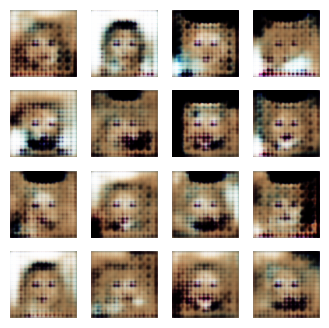

Epoch 42/50 | Generator loss: 6.6094, Discriminator loss: 0.7499 | Time: 52.19 s


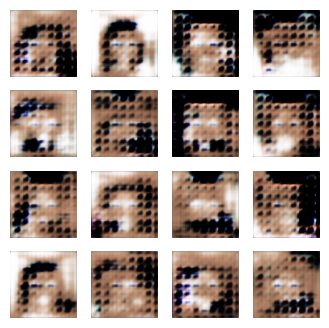

Epoch 43/50 | Generator loss: 6.5362, Discriminator loss: 0.9637 | Time: 51.99 s


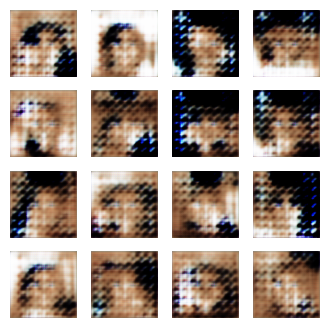

Epoch 44/50 | Generator loss: 8.2589, Discriminator loss: 0.9972 | Time: 52.02 s


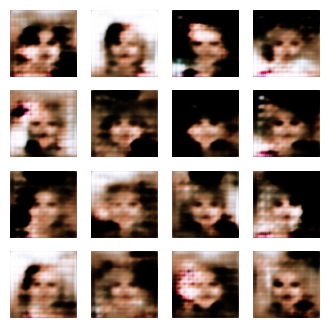

Epoch 45/50 | Generator loss: 7.1004, Discriminator loss: 0.5197 | Time: 51.97 s


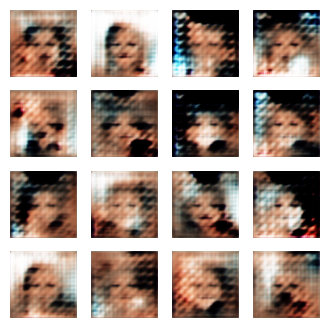

Epoch 46/50 | Generator loss: 5.4363, Discriminator loss: 1.0279 | Time: 51.96 s


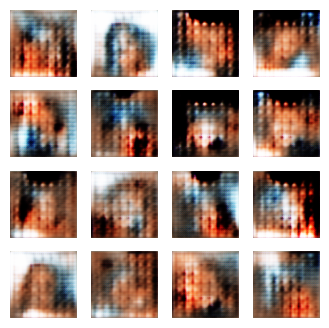

Epoch 47/50 | Generator loss: 5.2341, Discriminator loss: 0.8738 | Time: 52.05 s


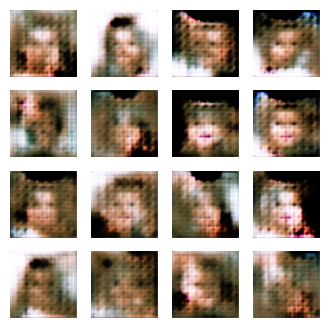

Epoch 48/50 | Generator loss: 8.1432, Discriminator loss: 0.9869 | Time: 51.98 s


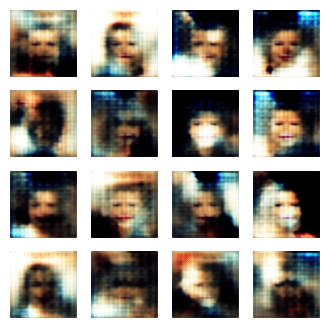

Epoch 49/50 | Generator loss: 8.1857, Discriminator loss: 0.7104 | Time: 52.12 s


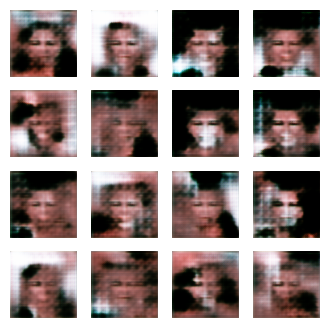

Epoch 50/50 | Generator loss: 7.2227, Discriminator loss: 0.8370 | Time: 52.14 s


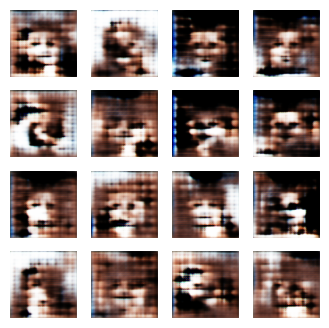


Total Training Time: 2632.08 seconds


In [ ]:
train(dataset, 50)
generator.save('generator_800.h5')